<a href="https://colab.research.google.com/github/eshaanmathakari/shrimpInfectionDetection/blob/main/shrimpDet_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import os
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import numpy as np


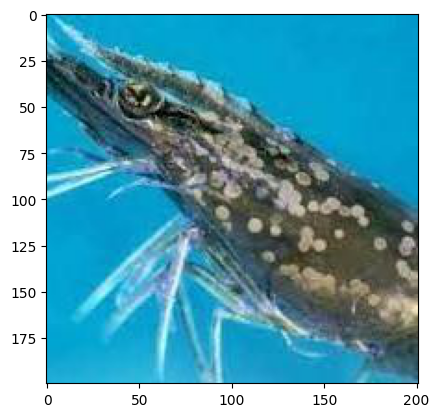

In [3]:
img = image.load_img(r"dataset/Image_dataset/test/wssv/download-12-_jpg.rf.d1192aacc59feb8219f525aff249249b.jpg")
plt.imshow(img)

In [6]:
cv2.imread(r"dataset/Image_dataset/test/wssv/download-12-_jpg.rf.d1192aacc59feb8219f525aff249249b.jpg").shape

(200, 201, 3)

In [7]:
train= ImageDataGenerator(rescale=1/255)

In [8]:
validation = ImageDataGenerator(rescale=1/255)

In [12]:
train_dataset = train.flow_from_directory(r"dataset/Augmented_data/train",target_size=(200,200),batch_size =3, class_mode='binary')

Found 1133 images belonging to 2 classes.


In [13]:
validation_dataset = train.flow_from_directory(r"dataset/Augmented_data/validation_data",target_size=(200,200),batch_size =3, class_mode='binary')

Found 282 images belonging to 2 classes.


In [14]:
dummy_test = train.flow_from_directory(r"dataset/Augmented_data/test_dummy", target_size=(200,200), batch_size=3,class_mode='binary')

Found 155 images belonging to 2 classes.


In [15]:
train_dataset.class_indices

{'healthy': 0, 'wssv': 1}

In [16]:
train_dataset.classes

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [17]:
dummy_test.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1], dtype=int32)

In [18]:
model = tf.keras.models.Sequential([tf.keras.layers.Conv2D(16,(3,3),activation ='relu',input_shape=(200,200,3)),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(32,(3,3),activation ='relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(64,(3,3),activation ='relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Flatten(),
                                    ##
                                    tf.keras.layers.Dense(512,activation ='relu'),
                                    ##
                                    tf.keras.layers.Dense(1,activation ='sigmoid')
                                   ])

/Users/prasunndubey/miniconda3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [19]:
model.compile(loss= 'binary_crossentropy', optimizer = RMSprop(learning_rate=0.001),
              metrics =['accuracy'])

In [20]:
modelfit = model.fit(train_dataset,
                    steps_per_epoch=8,
                    epochs=13,
                    validation_data = validation_dataset)

Epoch 1/13


/Users/prasunndubey/miniconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


8/8 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.4668 - loss: 9.7329 - val_accuracy: 0.6525 - val_loss: 1.5428
Epoch 2/13
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5514 - loss: 1.0626 - val_accuracy: 0.6596 - val_loss: 0.9553
Epoch 3/13
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6499 - loss: 1.1356 - val_accuracy: 0.6596 - val_loss: 0.6473
Epoch 4/13
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.4359 - loss: 0.8485 - val_accuracy: 0.6631 - val_loss: 0.6420
Epoch 5/13
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5267 - loss: 0.7175 - val_accuracy: 0.6596 - val_loss: 0.6387
Epoch 6/13
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.7086 - loss: 1.0226 - val_accuracy: 0.6596 - val_loss: 0.5960
Epoch 7/13
8/8 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6099 - loss: 0.7969 - val_accuracy: 0.6773 - val_loss: 0.5847
Epoch 8/13
8/8 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6845 - loss: 0.7599 - val_accuracy: 0.6525 - val_loss: 0.7621
Epoch 9/13
8/8 ━━━━━━━━━━━

In [33]:
import pandas as pd

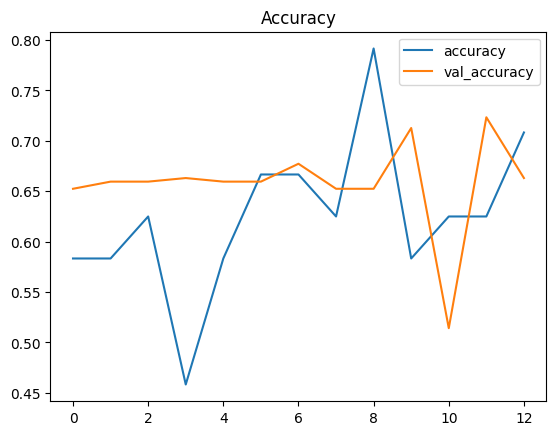

In [34]:
pd.DataFrame(modelfit.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

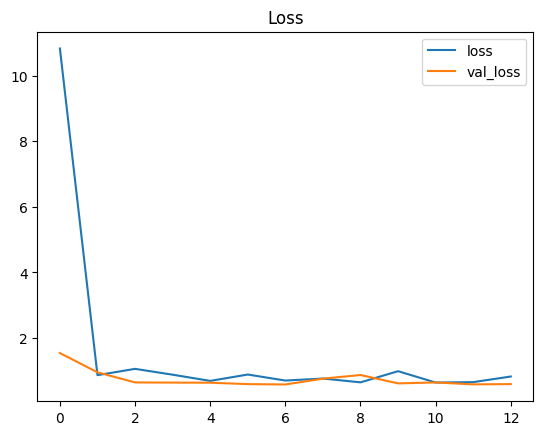

In [35]:
pd.DataFrame(modelfit.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

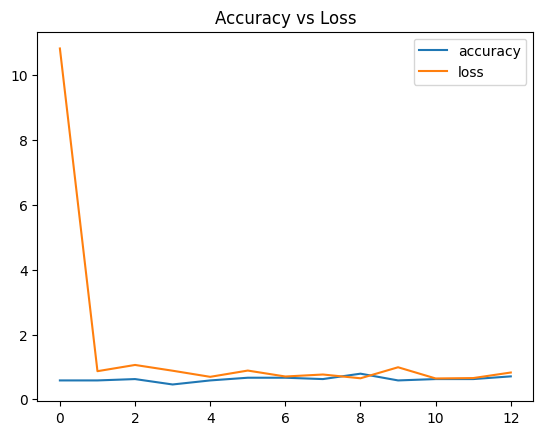

In [36]:
pd.DataFrame(modelfit.history)[['accuracy','loss']].plot()
plt.title("Accuracy vs Loss")
plt.show()

In [21]:
import os, sys, stat

Processing class: healthy


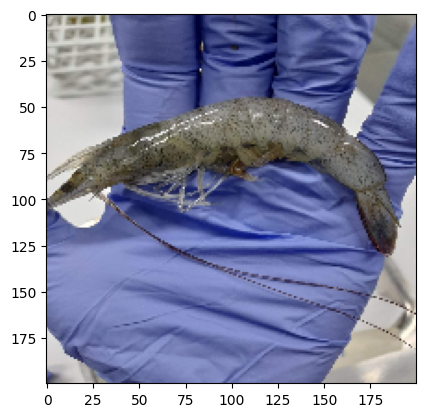

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
[[1.]]
This shrimp is infected with wssv


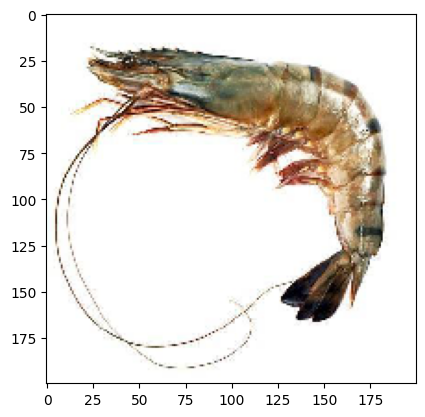

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


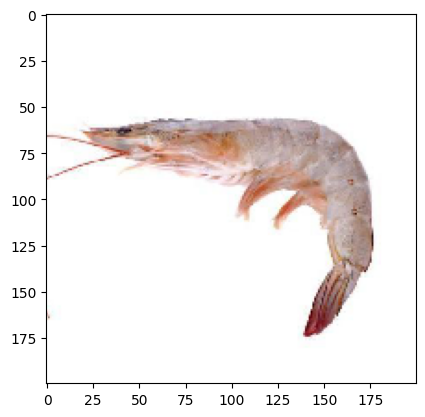

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


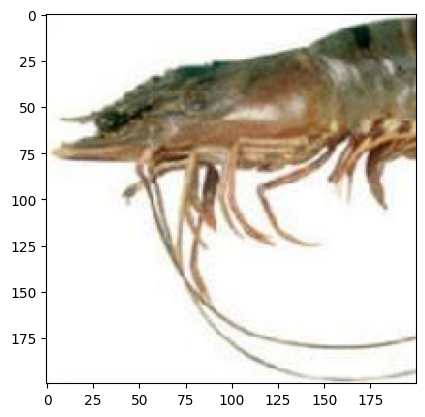

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
[[1.]]
This shrimp is infected with wssv


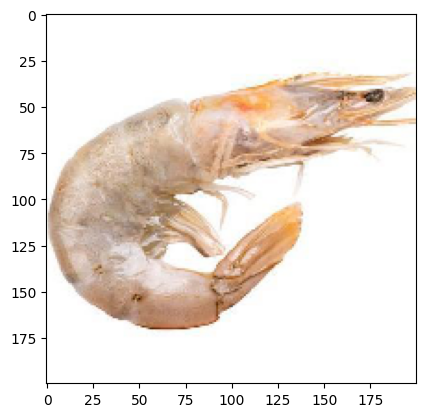

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
[[1.]]
This shrimp is infected with wssv


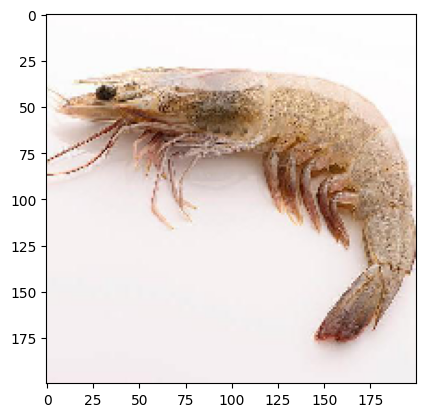

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
[[1.]]
This shrimp is infected with wssv


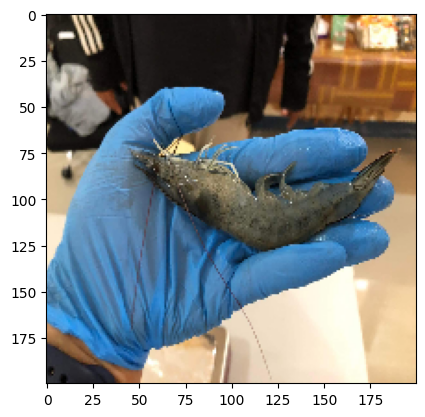

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


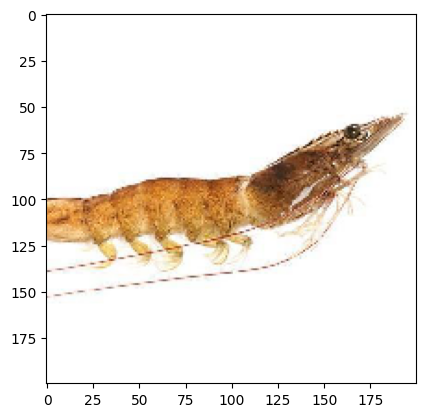

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


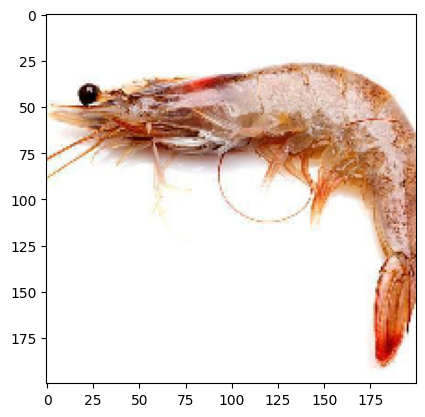

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


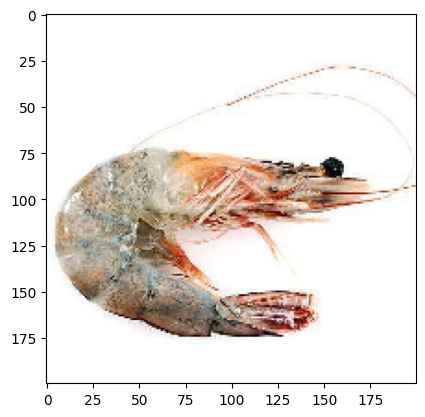

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
[[1.]]
This shrimp is infected with wssv


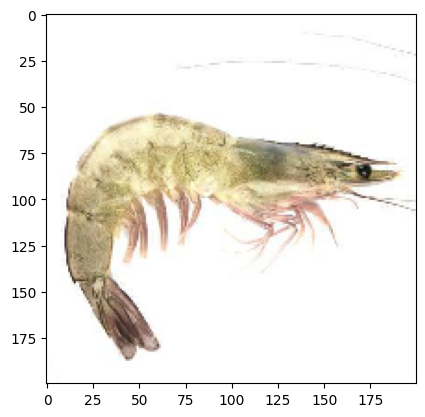

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


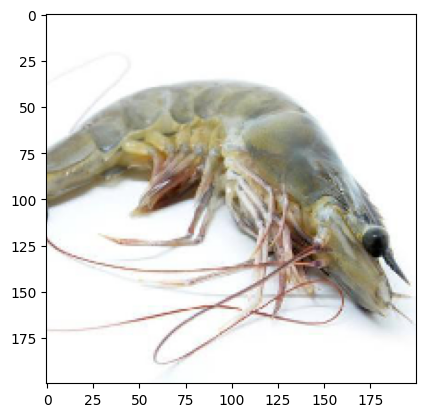

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[[1.]]
This shrimp is infected with wssv


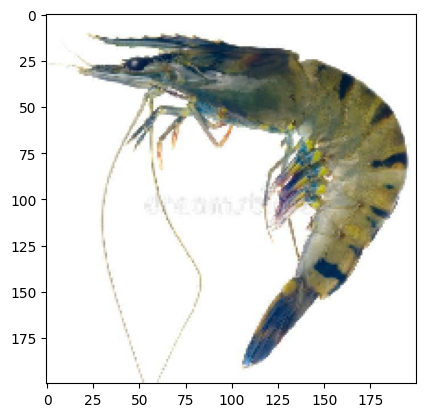

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


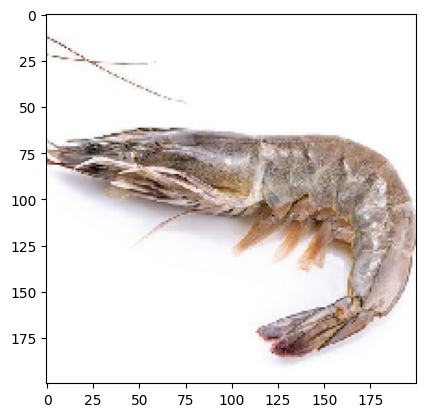

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
[[1.]]
This shrimp is infected with wssv


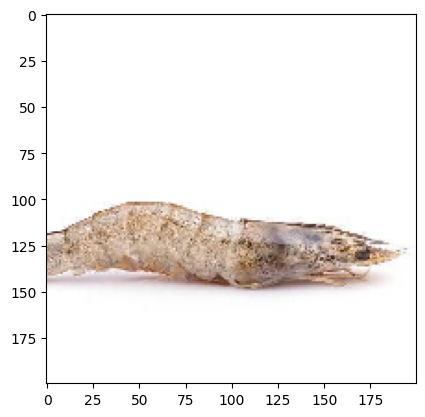

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
[[1.]]
This shrimp is infected with wssv


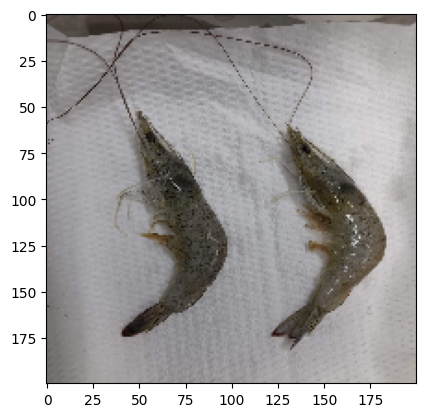

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
[[1.]]
This shrimp is infected with wssv


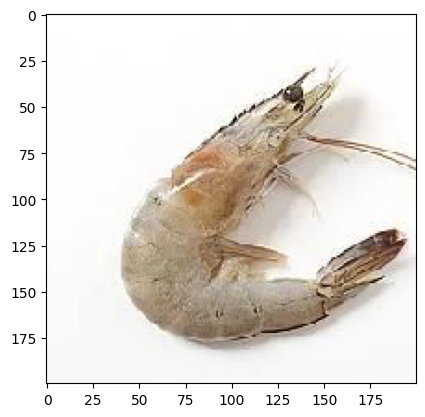

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


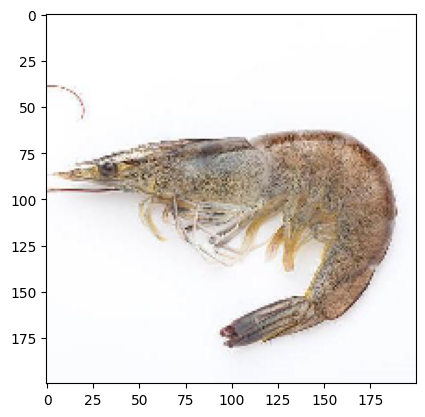

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


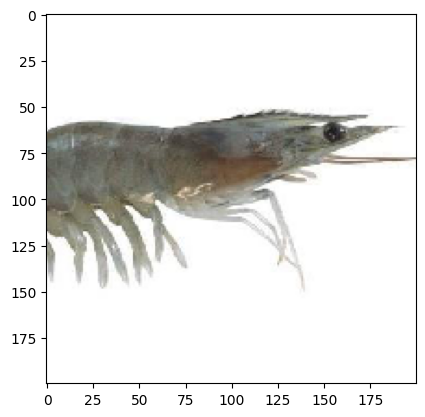

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


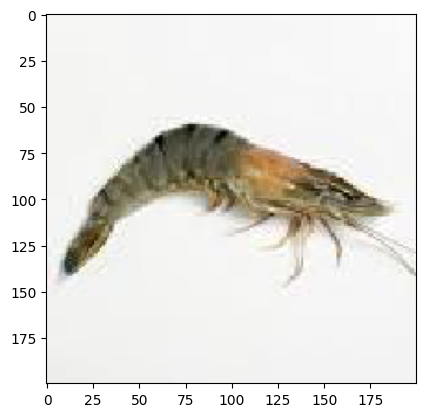

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
[[1.]]
This shrimp is infected with wssv


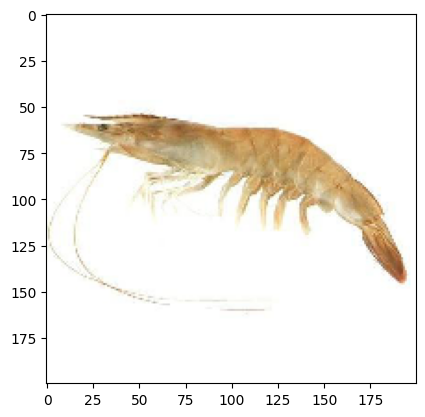

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
[[1.]]
This shrimp is infected with wssv


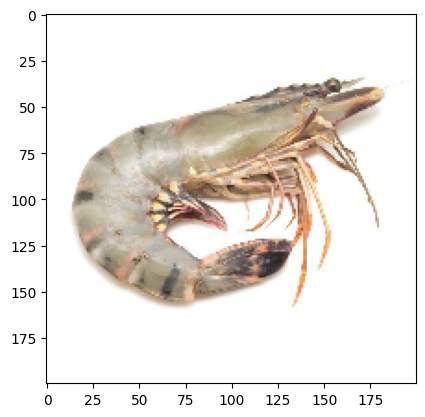

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
[[1.]]
This shrimp is infected with wssv


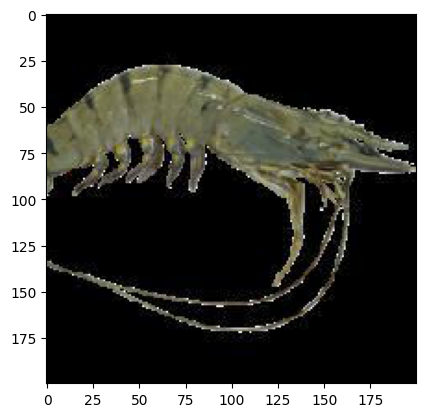

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[[1.]]
This shrimp is infected with wssv
Processing class: wssv


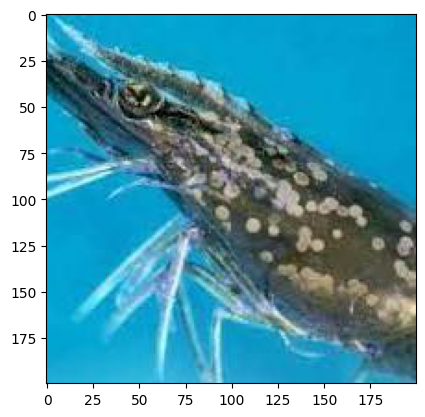

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


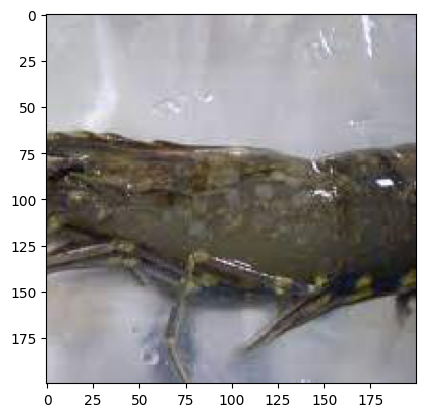

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
[[1.]]
This shrimp is infected with wssv


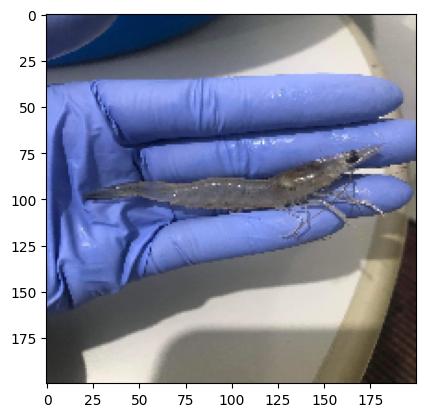

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
[[1.]]
This shrimp is infected with wssv


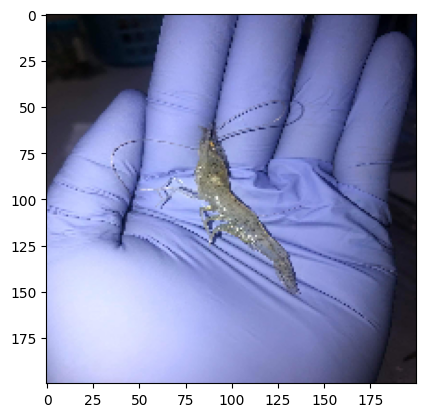

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[[1.]]
This shrimp is infected with wssv


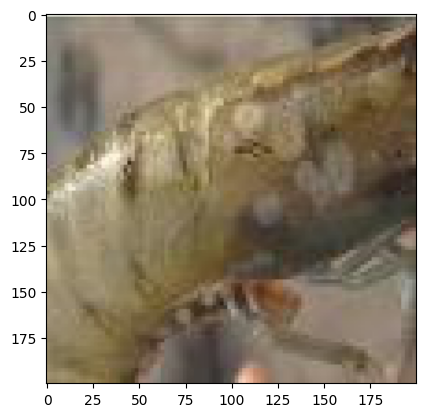

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[[1.]]
This shrimp is infected with wssv


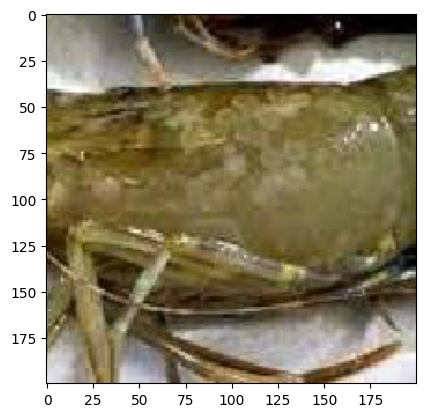

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
[[1.]]
This shrimp is infected with wssv


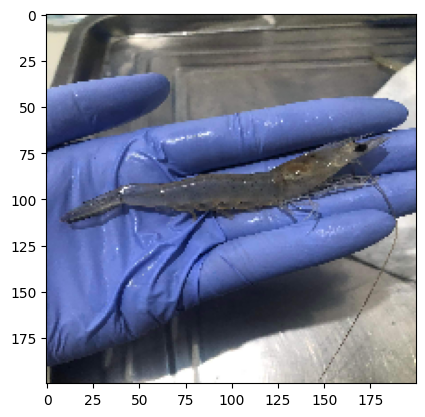

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


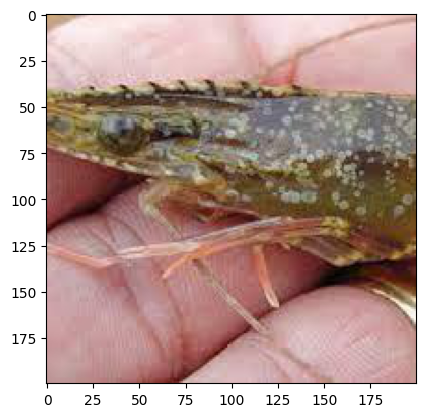

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


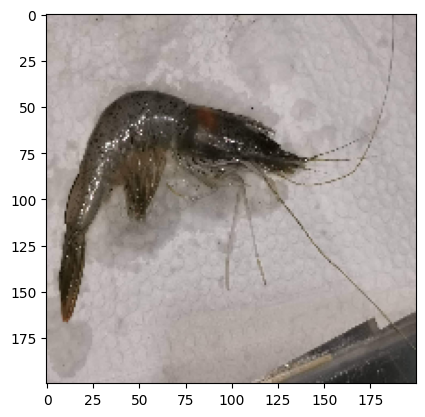

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
[[1.]]
This shrimp is infected with wssv


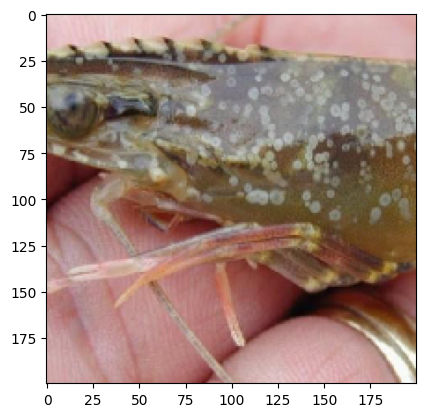

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
[[1.]]
This shrimp is infected with wssv


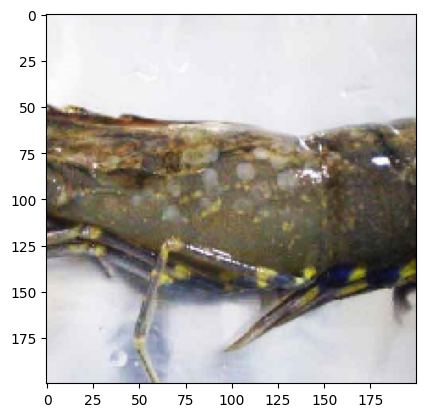

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
[[1.]]
This shrimp is infected with wssv


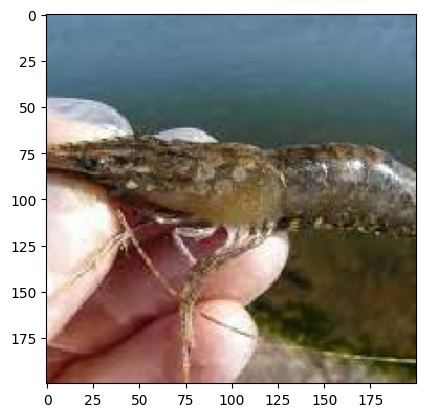

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
[[1.]]
This shrimp is infected with wssv


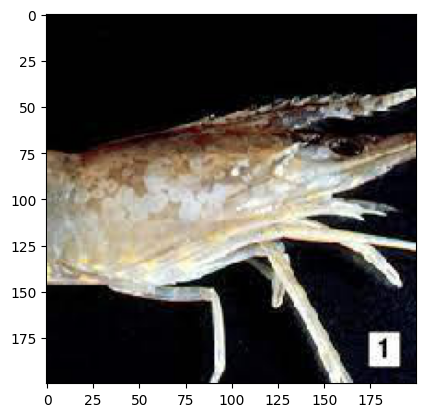

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
[[1.]]
This shrimp is infected with wssv


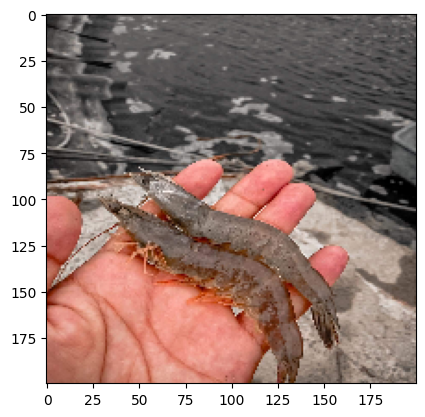

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
[[1.]]
This shrimp is infected with wssv


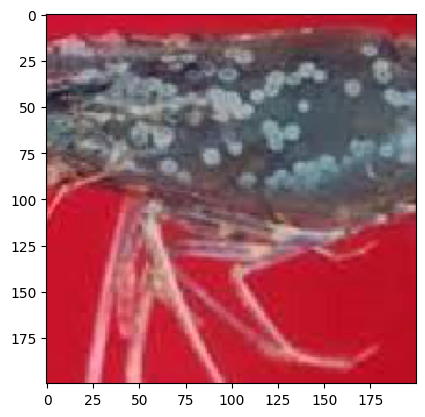

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


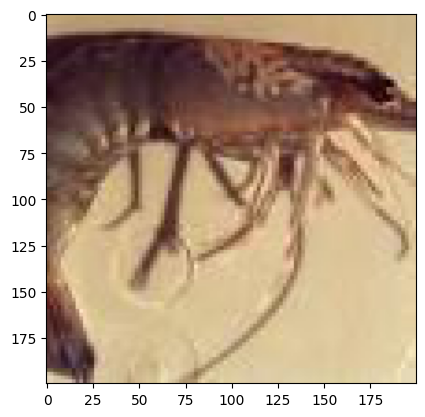

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


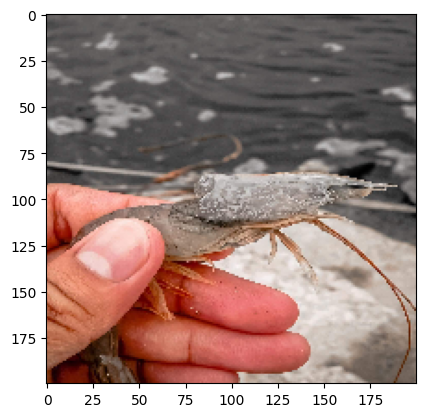

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
[[1.]]
This shrimp is infected with wssv


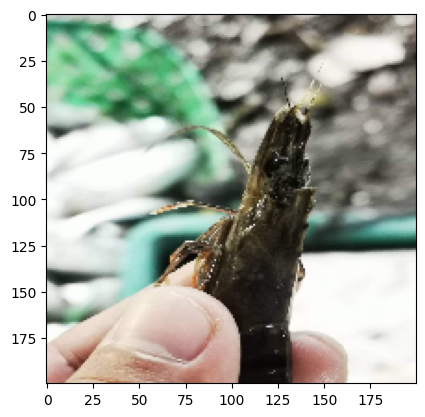

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


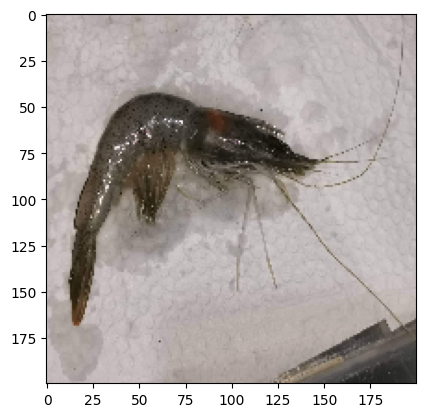

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


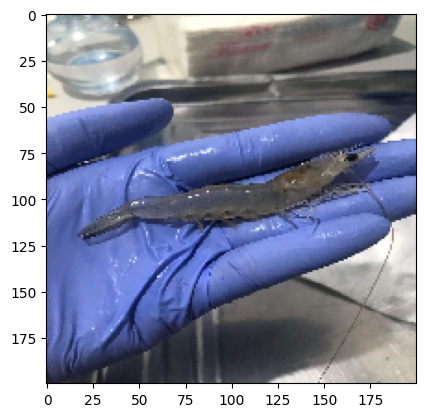

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


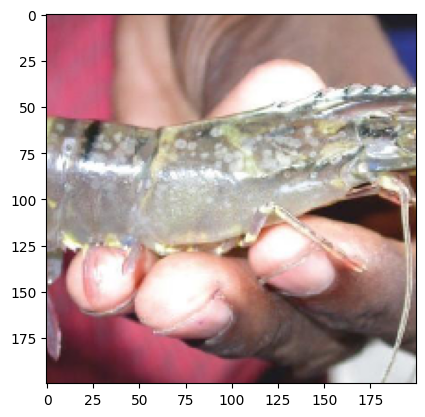

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
[[1.]]
This shrimp is infected with wssv


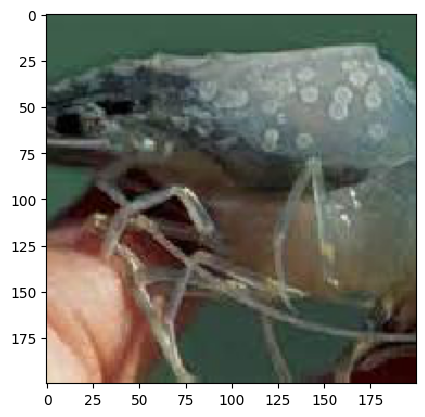

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
[[1.]]
This shrimp is infected with wssv


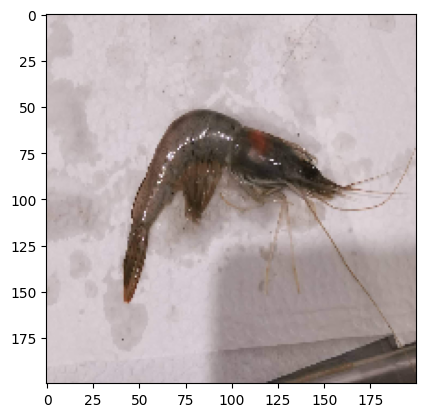

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
[[1.]]
This shrimp is infected with wssv


In [24]:
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

dir_path = r"dataset/Image_dataset/test"

# Loop over subfolders (classes)
for class_folder in os.listdir(dir_path):
    class_folder_path = os.path.join(dir_path, class_folder)
    if not os.path.isdir(class_folder_path):
        continue  # skip if not folder

    print(f"Processing class: {class_folder}")
    # Loop over image files inside class folder
    for img_file in os.listdir(class_folder_path):
        img_path = os.path.join(class_folder_path, img_file)

        # Load and preprocess image
        img = image.load_img(img_path, target_size=(200, 200))
        plt.imshow(img)
        plt.show()

        X = image.img_to_array(img)
        X = np.expand_dims(X, axis=0)
        images = np.vstack([X])

        val = model.predict(images)
        print(val)
        if val < 0.5:
            print("This shrimp is healthy.")
        else:
            print("This shrimp is infected with wssv")


In [25]:
model.save("customcnn_model.h5")

In [26]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

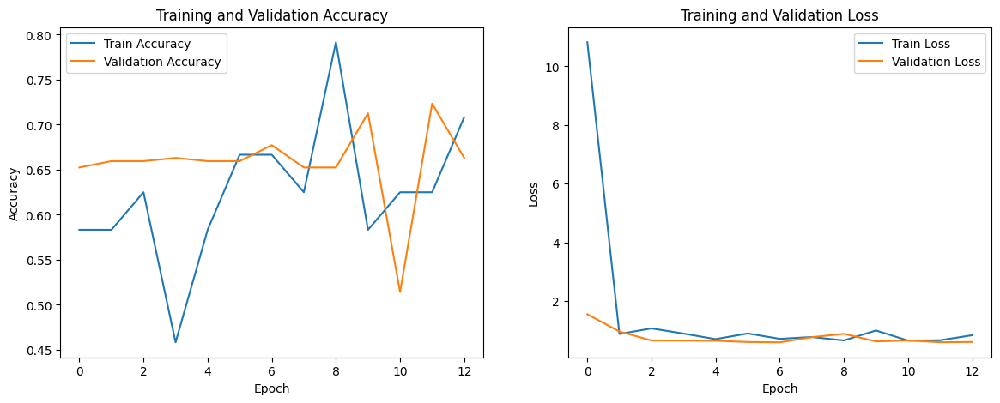

In [27]:
# 1. Plot training & validation accuracy and loss

def plot_training_curves(history):
    plt.figure(figsize=(14,5))

    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_training_curves(modelfit)

95/95 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step


/Users/prasunndubey/miniconda3/lib/python3.12/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


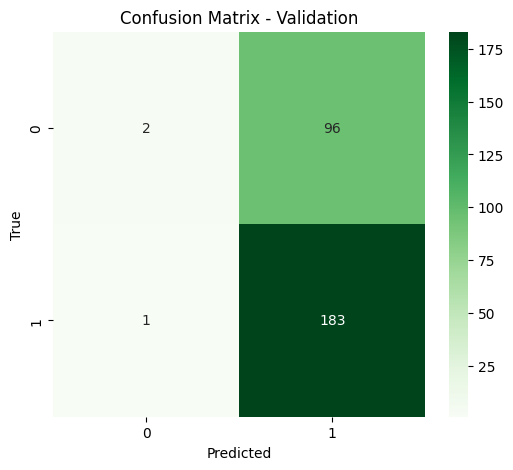

Classification Report - Validation Set
              precision    recall  f1-score   support

     healthy       0.67      0.02      0.04        98
        wssv       0.66      0.99      0.79       184

    accuracy                           0.66       282
   macro avg       0.66      0.51      0.42       282
weighted avg       0.66      0.66      0.53       282



In [28]:
# 2. Confusion Matrix and Classification Report on Validation Set

val_steps = validation_dataset.samples // validation_dataset.batch_size + 1
pred_probs = model.predict(validation_dataset, steps=val_steps)
y_pred = (pred_probs > 0.5).astype(int).reshape(-1)
y_true = validation_dataset.classes[:len(y_pred)]

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
plt.title('Confusion Matrix - Validation')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

print("Classification Report - Validation Set")
print(classification_report(y_true, y_pred, target_names=list(validation_dataset.class_indices.keys())))

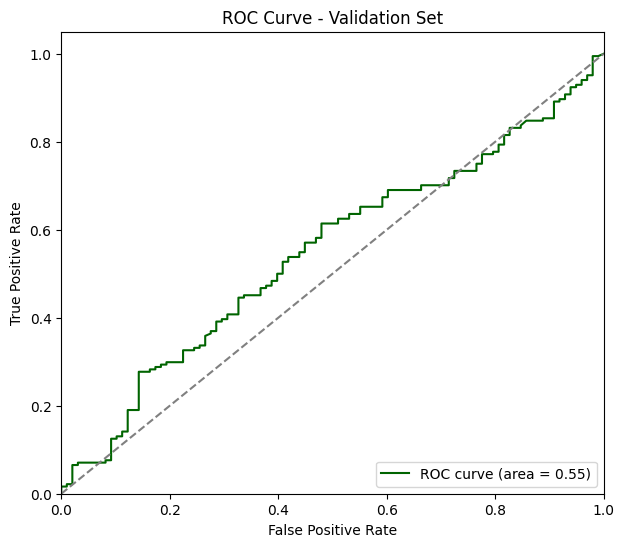

In [29]:
# 3. ROC Curve + AUC

fpr, tpr, thresholds = roc_curve(y_true, pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7,6))
plt.plot(fpr, tpr, color='darkgreen', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0,1],[0,1], color='gray', linestyle='--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Validation Set')
plt.legend(loc='lower right')
plt.show()

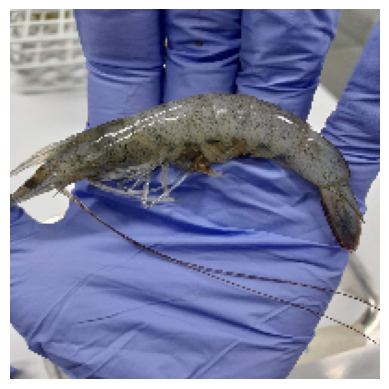

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prediction: Infected (Confidence: 0.73)


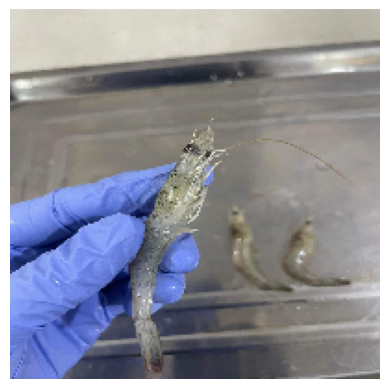

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Prediction: Infected (Confidence: 0.77)


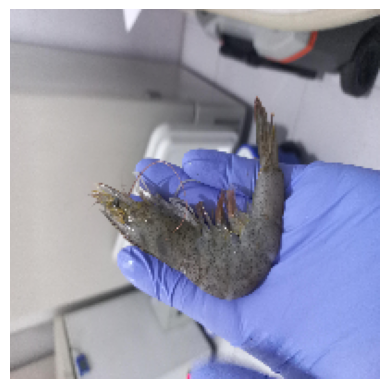

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction: Infected (Confidence: 0.62)


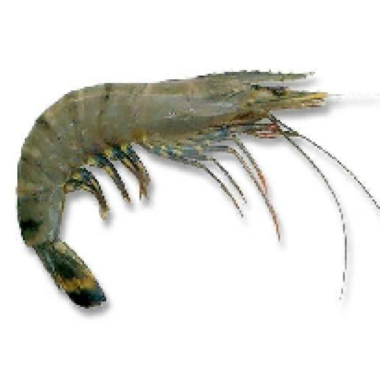

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Prediction: Infected (Confidence: 0.73)


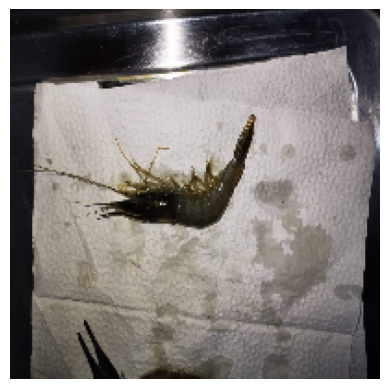

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Prediction: Infected (Confidence: 0.62)


In [30]:
# 4. Sample Predictions with Images

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import os

def show_sample_predictions(folder_path, model, target_size=(200,200), n=5):
    img_files = []
    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('png','jpg','jpeg')):
                img_files.append(os.path.join(root,file))

    for img_path in img_files[:n]:
        img = image.load_img(img_path, target_size=target_size)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0) / 255.0
        pred = model.predict(x)[0][0]
        label = "Infected" if pred > 0.5 else "Healthy"
        print(f"Prediction: {label} (Confidence: {pred:.2f})")

# Example (update this path to your test folder)
show_sample_predictions("dataset/Augmented_data/test_dummy", model)

In [31]:
# 5. Model summary

model.summary()

print("\nTrainable layers:")
for layer in model.layers:
    if layer.trainable:
        print(f"{layer.name}: {layer.trainable}")

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 198, 198, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 99, 99, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 97, 97, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 48, 48, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 46, 46, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 33856)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    17,334,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 34,717,764 (132.44 MB)

 Trainable params: 17,358,881 (66.22 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 17,358,883 (66.22 MB)


Trainable layers:
conv2d: True
max_pooling2d: True
conv2d_1: True
max_pooling2d_1: True
conv2d_2: True
max_pooling2d_2: True
flatten: True
dense: True
dense_1: True
